In [1]:
## Compare original and new ASIC initialization settings

# 1 - Plot first 500 original background and original data waveforms
# 2 - Plot first 500 new background and new data waveforms
# 3 - Original Settings (using phase): Find average background per block, Find pedestal subtracted data for each block, average across blocks
# 4 - Plot averaged pedestal subtracted Original settings
# 5 - New Settings (using phase): Find average background per block, Find pedestal subtracted data for each block, average across blocks
# 6 - Plot averaged pedestal subtracted New settings
# 7 - Compare Original and New settings by ASIC
# Problem - Spikes at the block boundry seem to be caused by improper pedestal subtraction
# 8 - Check for events with phase>31
# 9 - Remove events with phase>32 from the analysis (original settings)
# 10 - Change how phase=16 is treated in analysis
# 11 - Check if raw waveforms of the same assigned phase are in the same location - They aren't! Phases are being assigned incorrectly!

# Conclusion - New Settings seem to produce smaller glitch behavior

In [1]:
%pylab inline
import numpy as np
import matplotlib.pyplot as plt
import os.path

Populating the interactive namespace from numpy and matplotlib


In [2]:
#Setting plot default sizes
plt.rc('axes', titlesize = 40)
plt.rc('axes', labelsize = 30)
plt.rc('xtick', labelsize = 20)
plt.rc('ytick', labelsize = 20)
plt.rc('legend', fontsize = 20)
plt.rc('figure', titlesize = 40)
plt.figure(figsize(12,9))

In [27]:
# Import background and data

# Original settings
original_background = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321506ASIC1CH6.npz", 'r'))
original_data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321507ASIC2CH6.npz", 'r'))

# New settings
new_background = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321508ASIC1CH6.npz", 'r'))
new_data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321509ASIC1CH6.npz", 'r'))

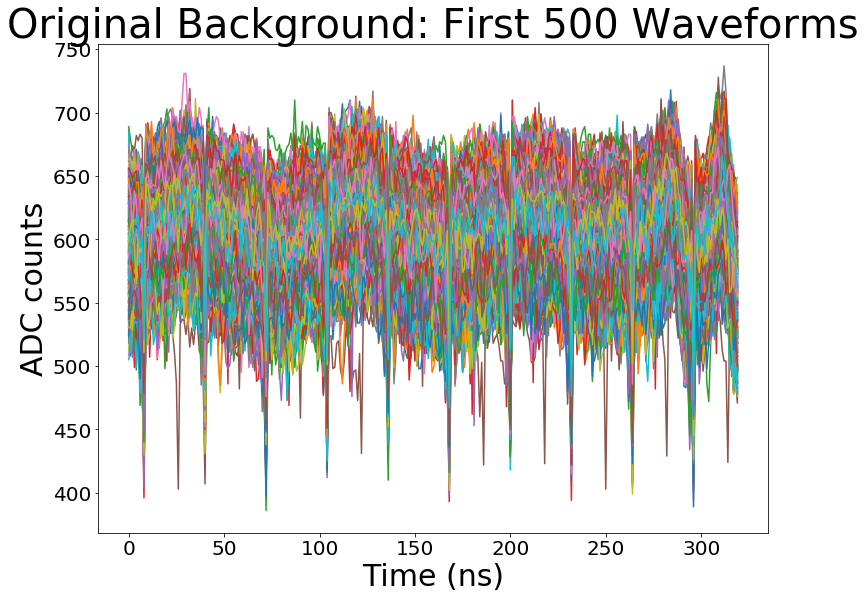

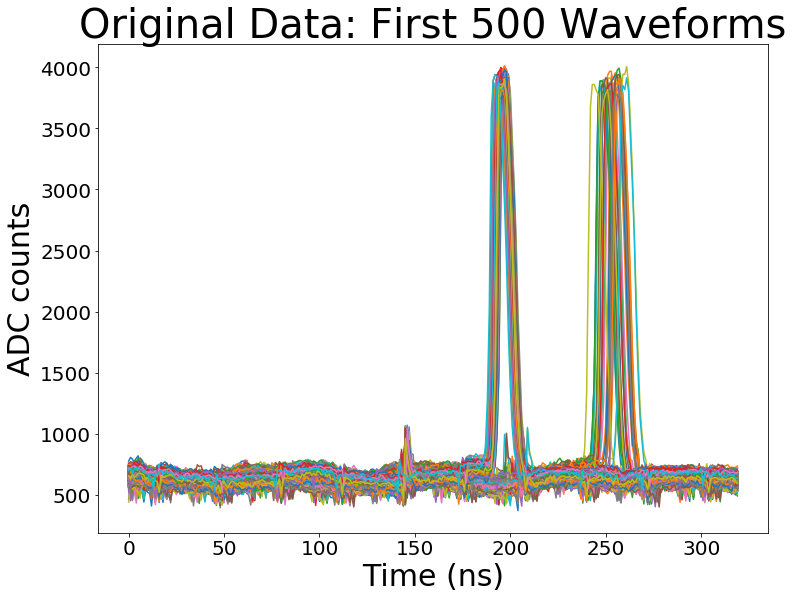

In [5]:
# Plot background and data for Original Settings

for event in range(500):
    plt.plot(original_background['samples'][event])
plt.title('Original Background: First 500 Waveforms')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.show()

for event in range(500):
    plt.plot(original_data['samples'][event])
plt.title('Original Data: First 500 Waveforms')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.show()

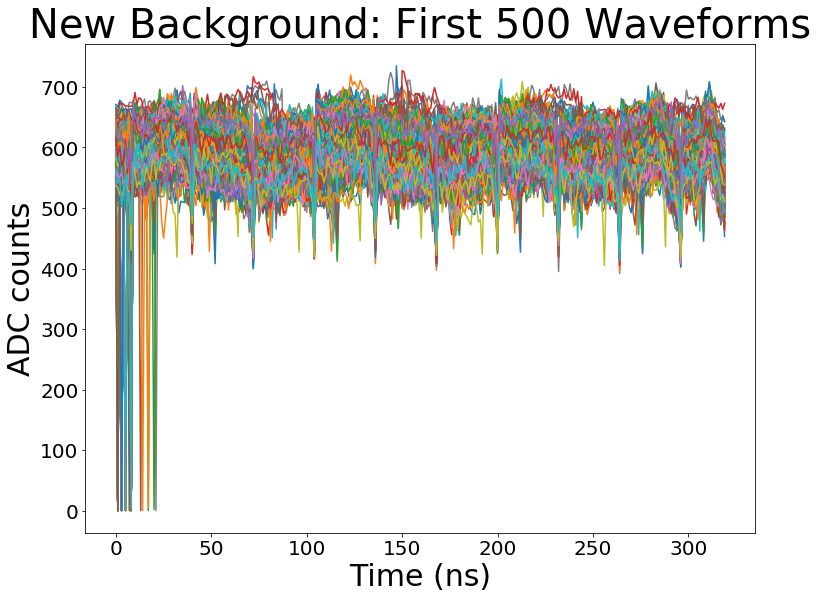

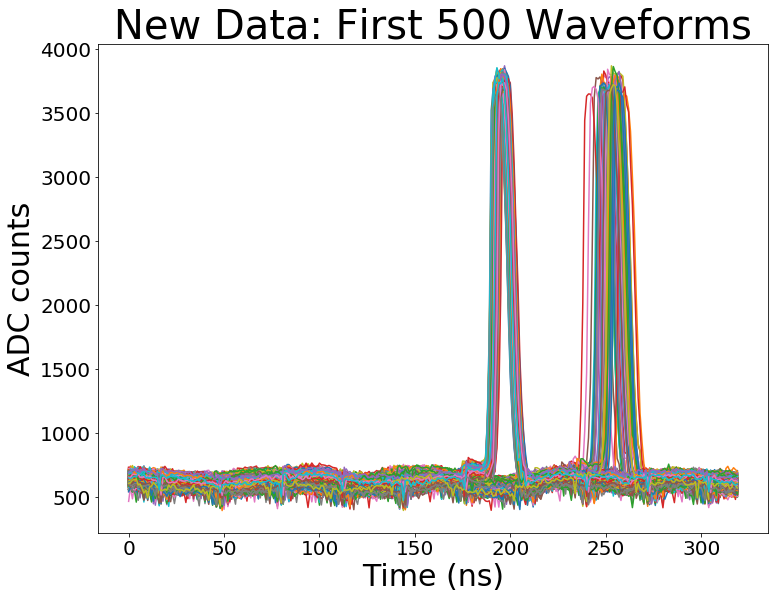

In [6]:
# Plot background and data for New Settings

for event in range(500):
    plt.plot(new_background['samples'][event])
plt.title('New Background: First 500 Waveforms')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.show()

for event in range(500):
    plt.plot(new_data['samples'][event])
plt.title('New Data: First 500 Waveforms')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.show()

In [7]:
## Original Settings - Using Phase ##

In [38]:
# Find the average original background for each block for each ASIC
# Shape = (ASIC=4, Block=512, Data=288)

original_background = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321506ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            current_block = int(data['block'][event])
            if current_block == block:
                phase = int(data['phase'][event])
                shift = 31 - phase + 16*(phase>=16) - 16*(phase<16)
                events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                element.append(events_by_block[event][point])
            average.append(mean(element))
        avg_per_block.append(average)
    original_background.append(avg_per_block)

In [39]:
# Find the average pedistal subtracted data for each block for original settings

original_data = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321507ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            current_block = int(data['block'][event])
            if current_block == block:
                phase = int(data['phase'][event])
                shift = 31 - phase + 16*(phase>=16) - 16*(phase<16)
                events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                pedistal_subtract = events_by_block[event][point] - original_background[ASIC][block][point]
                element.append(pedistal_subtract)
            average.append(mean(element))
        avg_per_block.append(average)
    original_data.append(avg_per_block)

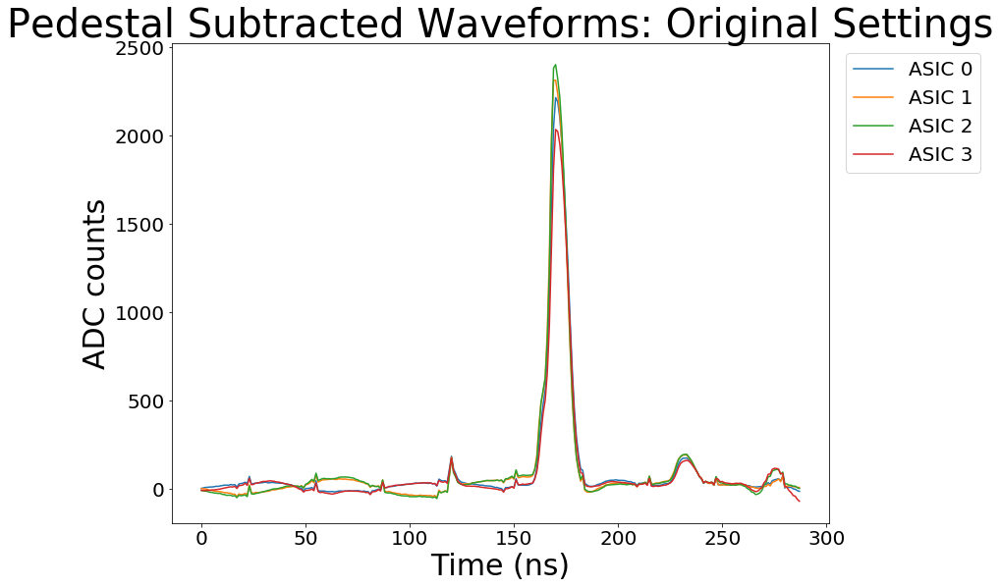

In [40]:
# Combine all blocks for original settings

pedestal_subtracted_original = []
for ASIC in range(4):
    average = []
    for point in range(288):
        by_block = [original_data[ASIC][block][point] for block in range(512)]
        average.append(mean(by_block))
    pedestal_subtracted_original.append(average)

for ASIC in range(4):
    plt.plot(pedestal_subtracted_original[ASIC], label = 'ASIC ' + str(ASIC))
plt.title('Pedestal Subtracted Waveforms: Original Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

In [11]:
## New Settings - Using Phase ##

In [12]:
# Find the average new background for each block for each ASIC
# Shape = (ASIC=4, Block=512, Data=288)

new_background = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321508ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            current_block = int(data['block'][event])
            if current_block == block:
                phase = int(data['phase'][event])
                shift = 31 - phase + 16*(phase>=16) - 16*(phase<16)
                events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                element.append(events_by_block[event][point])
            average.append(mean(element))
        avg_per_block.append(average)
    new_background.append(avg_per_block)

In [13]:
# Find the average pedistal subtracted data for each block for New settings

new_data = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321509ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            current_block = int(data['block'][event])
            if current_block == block:
                phase = int(data['phase'][event])
                shift = 31 - phase + 16*(phase>=16) - 16*(phase<16)
                events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                pedistal_subtract = events_by_block[event][point] - new_background[ASIC][block][point]
                element.append(pedistal_subtract)
            average.append(mean(element))
        avg_per_block.append(average)
    new_data.append(avg_per_block)

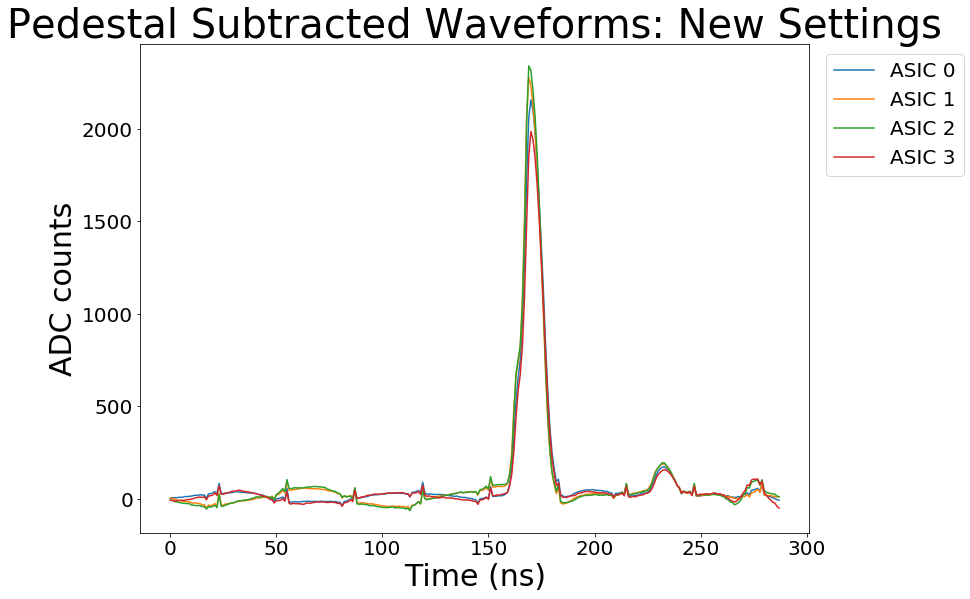

In [14]:
# Combine all blocks for new settings

pedestal_subtracted_new = []
for ASIC in range(4):
    average = []
    for point in range(288):
        by_block = [new_data[ASIC][block][point] for block in range(512)]
        average.append(mean(by_block))
    pedestal_subtracted_new.append(average)

for ASIC in range(4):
    plt.plot(pedestal_subtracted_new[ASIC], label = 'ASIC ' + str(ASIC))
plt.title('Pedestal Subtracted Waveforms: New Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

In [15]:
## Compare Settings by ASIC ##

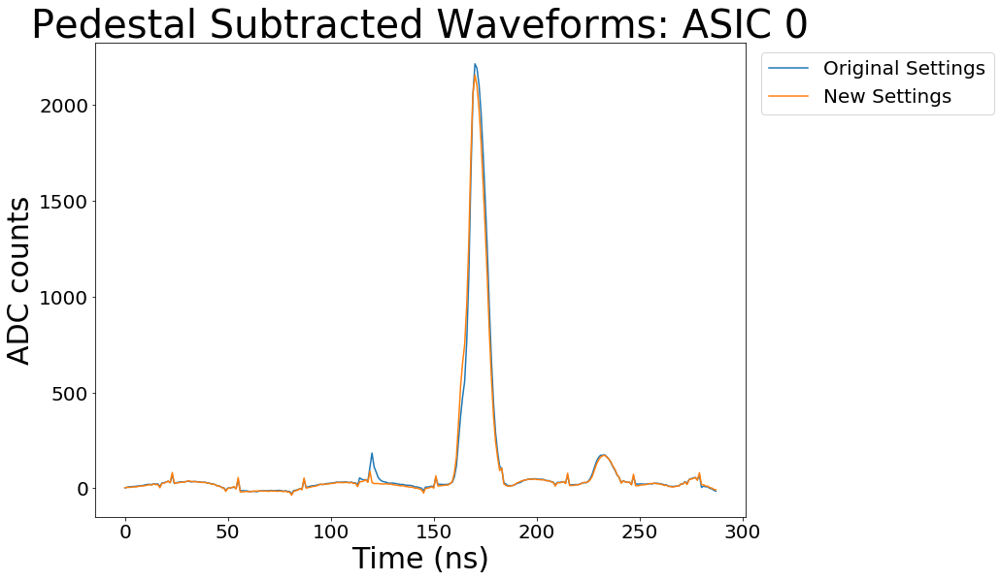

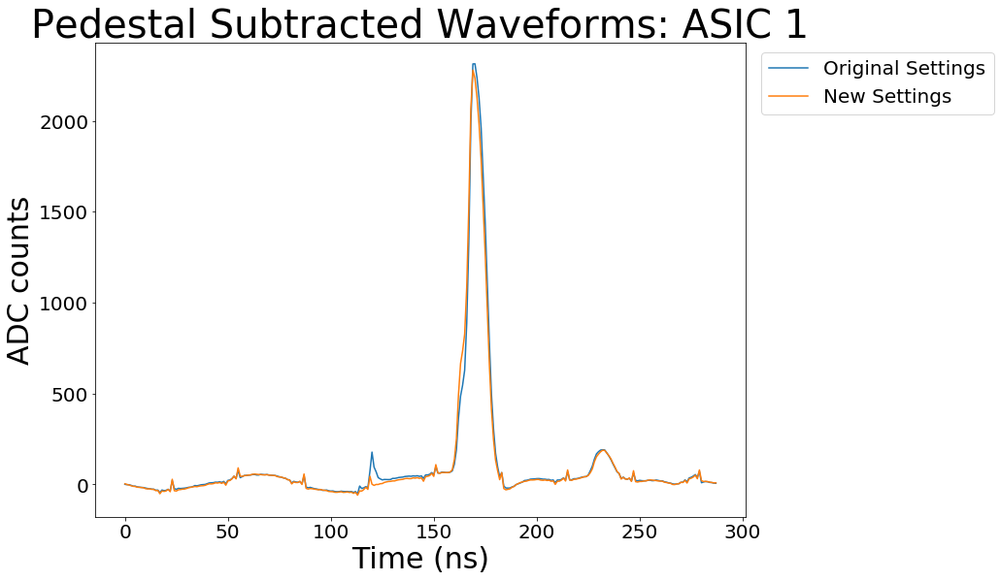

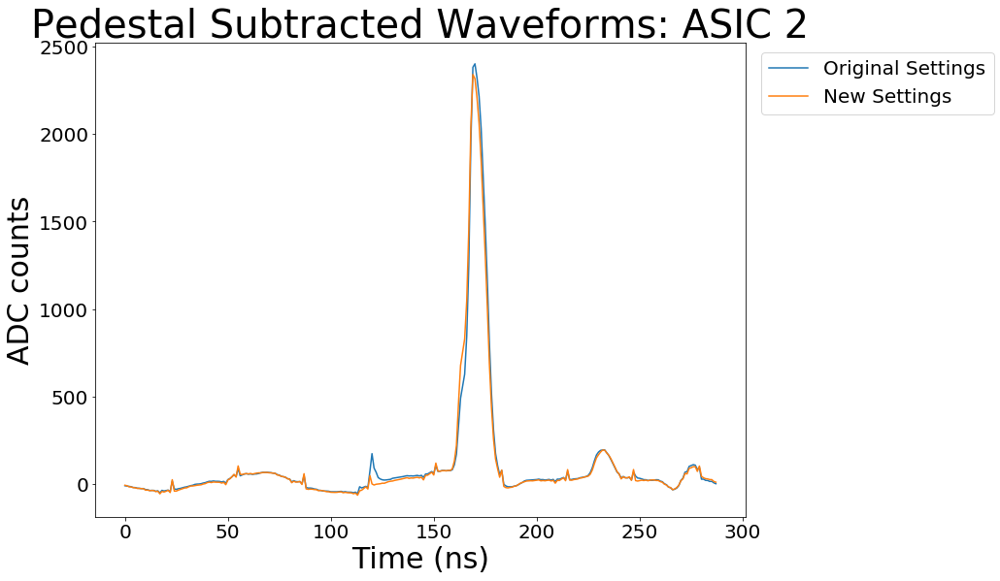

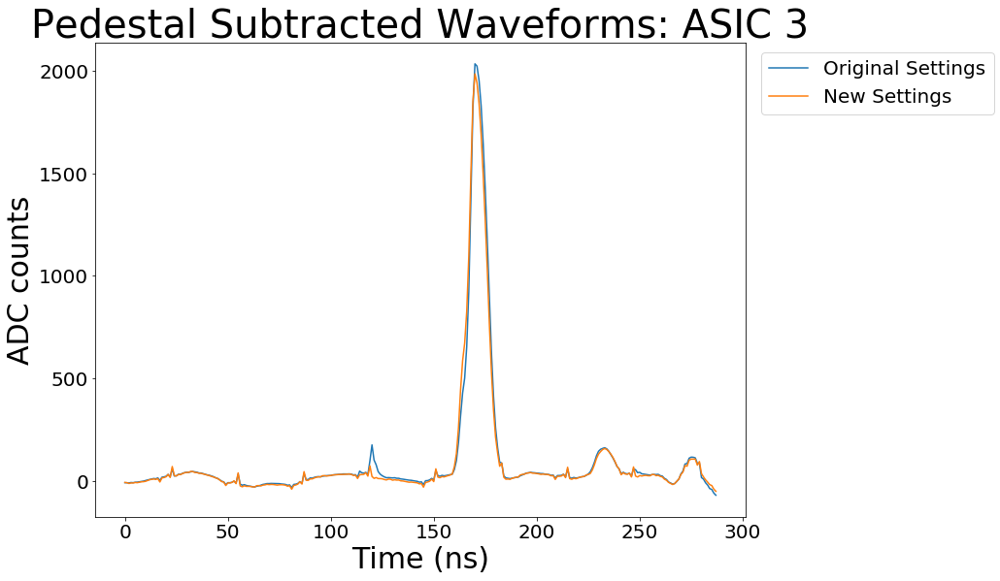

In [16]:
# Plot full waveforms for both settings

for ASIC in range(4):
    plt.plot(pedestal_subtracted_original[ASIC], label = 'Original Settings')
    plt.plot(pedestal_subtracted_new[ASIC], label = 'New Settings')
    plt.title('Pedestal Subtracted Waveforms: ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()

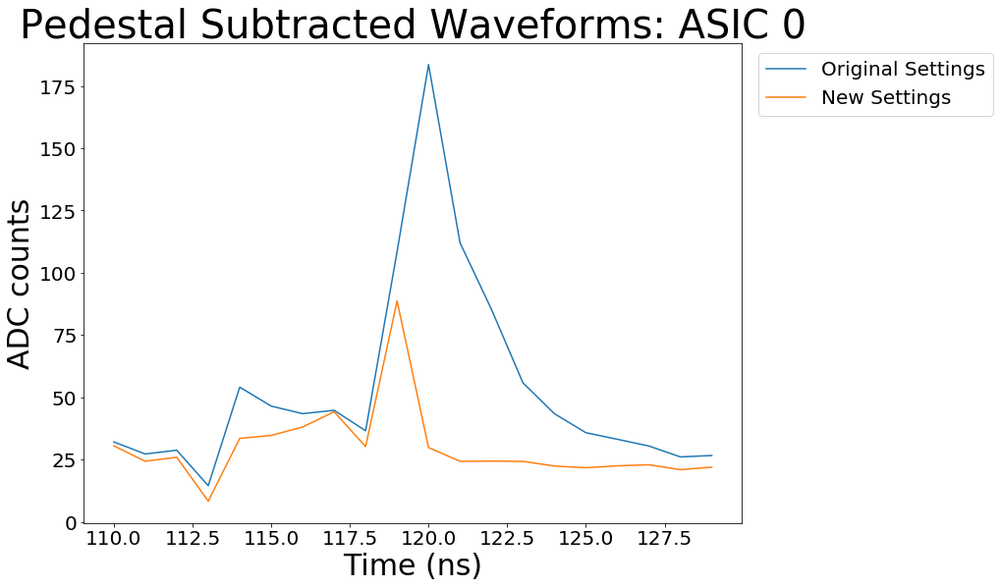

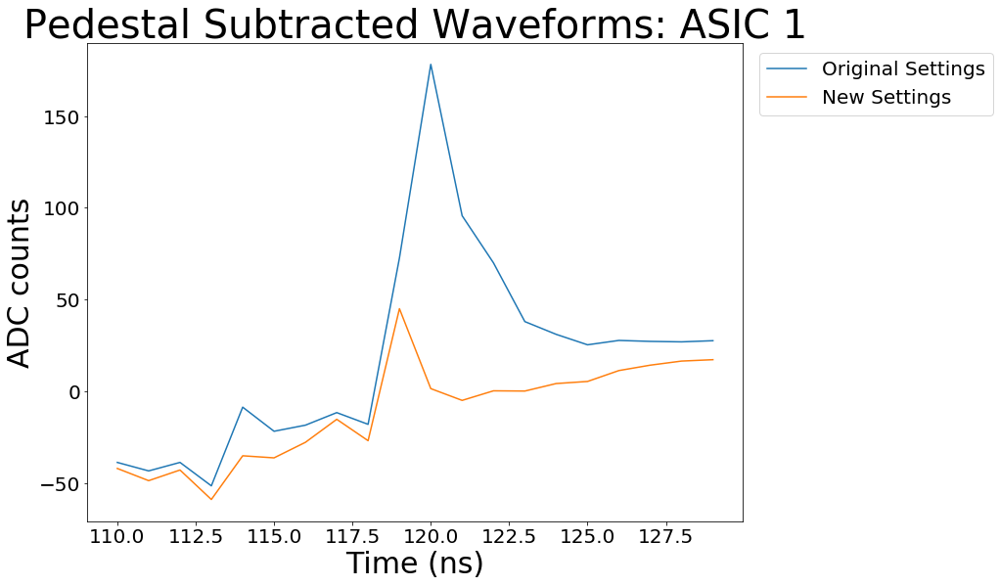

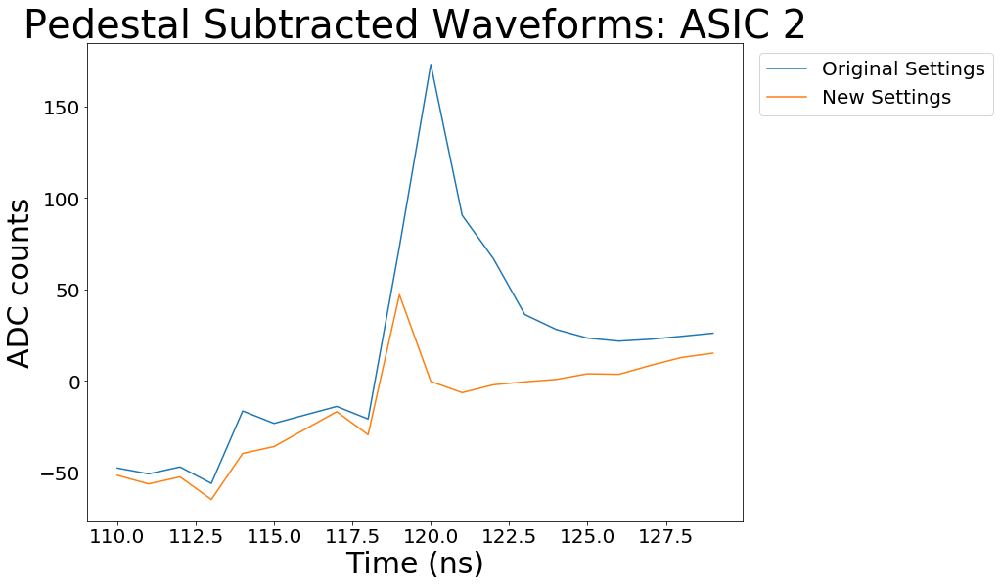

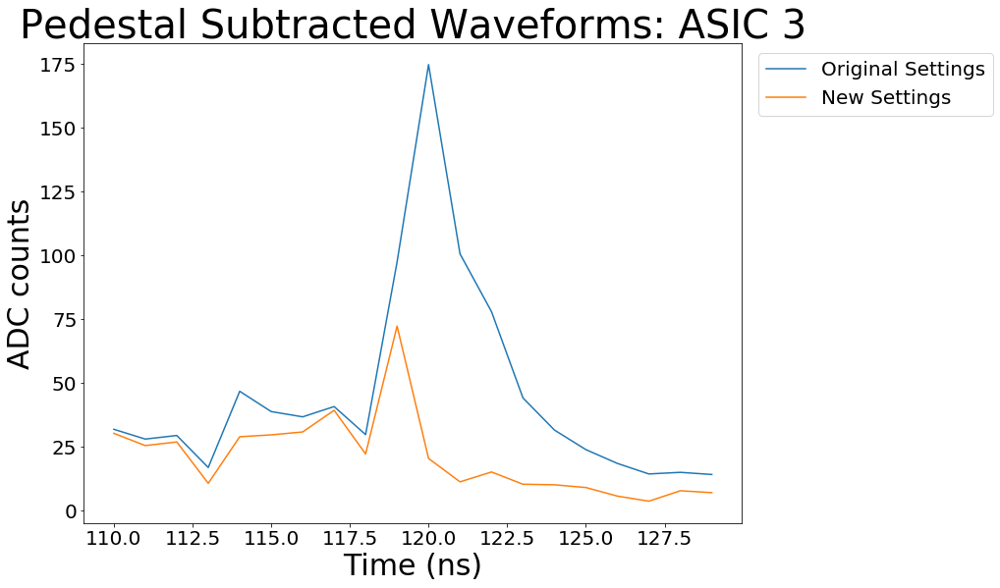

In [17]:
# Zoom in on Glitch for both settings

x = [i for i in range(110,130)]
for ASIC in range(4):
    plt.plot(x, pedestal_subtracted_original[ASIC][110:130], label = 'Original Settings')
    plt.plot(x, pedestal_subtracted_new[ASIC][110:130], label = 'New Settings')
    plt.title('Pedestal Subtracted Waveforms: ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()

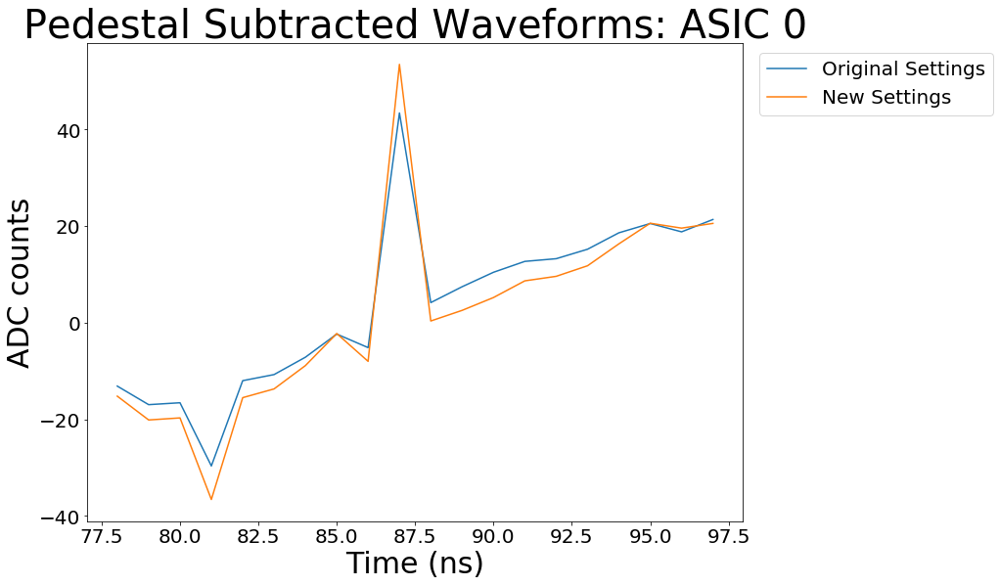

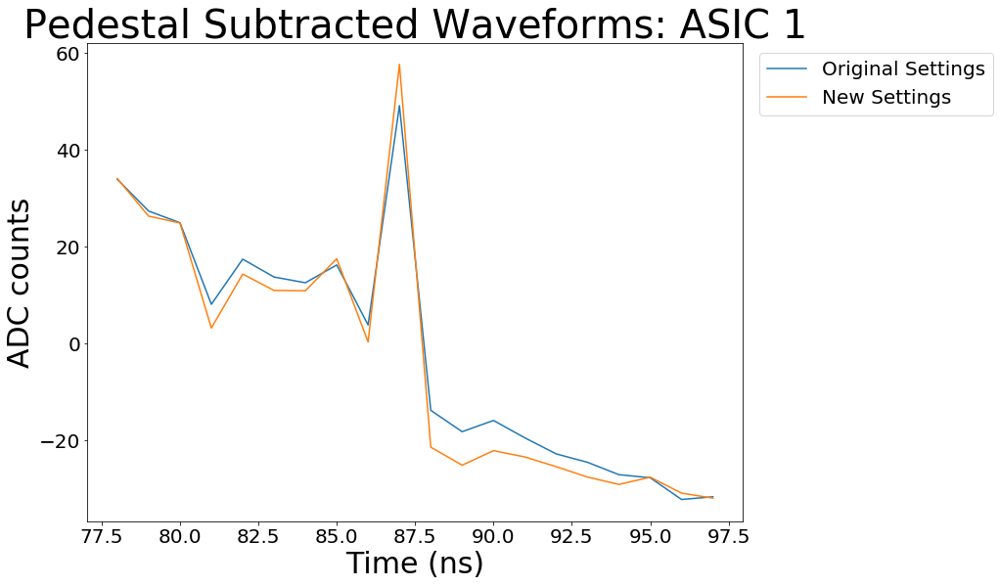

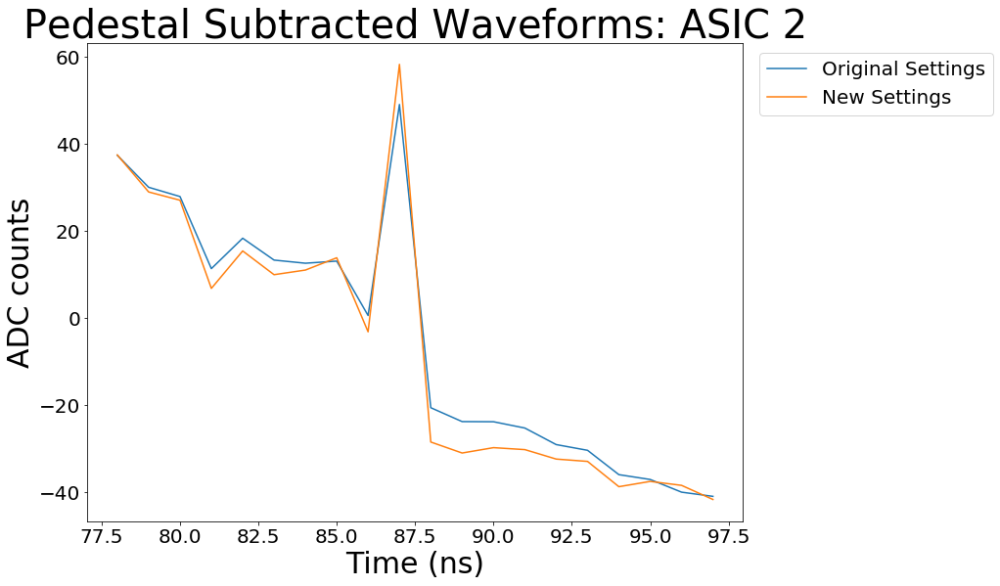

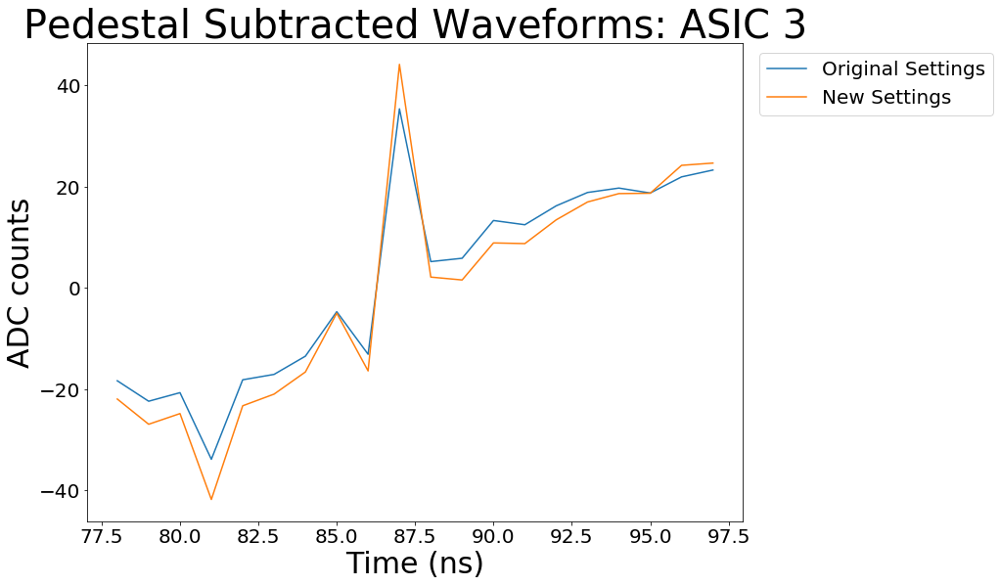

In [18]:
# Zoom in on normal block boundry for both settings

x = [i for i in range(78,98)]
for ASIC in range(4):
    plt.plot(x, pedestal_subtracted_original[ASIC][78:98], label = 'Original Settings')
    plt.plot(x, pedestal_subtracted_new[ASIC][78:98], label = 'New Settings')
    plt.title('Pedestal Subtracted Waveforms: ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()

In [19]:
# Conclusion - New Settings seem to produce smaller glitch behavior
# Problem - Spikes at the block boundry seem to be caused by improper pedestal subtraction
    # Phases > 32 ?
    # Problem with phase = 16

In [45]:
# Check for phases greater than 32

#Original background
orig_back_phases = {}
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321506ASIC" + str(ASIC) + "CH6.npz", 'r'))
    phases = np.ndarray.tolist(data['phase'])
    unique_phases = np.unique(data['phase'])
    phase_dict = {}
    for phase in phases:
        if phase>31:
            phase_dict[phase] = phases.count(phase)
    orig_back_phases['ASIC ' + str(ASIC)] = phase_dict
print(orig_back_phases)
            
#Original data
orig_data_phases = {}
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321507ASIC" + str(ASIC) + "CH6.npz", 'r'))
    phases = np.ndarray.tolist(data['phase'])
    unique_phases = np.unique(data['phase'])
    phase_dict = {}
    for phase in phases:
        if phase>31:
            phase_dict[phase] = phases.count(phase)
    orig_data_phases['ASIC ' + str(ASIC)] = phase_dict
print(orig_data_phases)

#New background
new_back_phases = {}
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321508ASIC" + str(ASIC) + "CH6.npz", 'r'))
    phases = np.ndarray.tolist(data['phase'])
    unique_phases = np.unique(data['phase'])
    phase_dict = {}
    for phase in phases:
        if phase>31:
            phase_dict[phase] = phases.count(phase)
    new_back_phases['ASIC ' + str(ASIC)] = phase_dict
print(new_back_phases)

#New data
new_data_phases = {}
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321509ASIC" + str(ASIC) + "CH6.npz", 'r'))
    phases = np.ndarray.tolist(data['phase'])
    unique_phases = np.unique(data['phase'])
    phase_dict = {}
    for phase in phases:
        if phase>31:
            phase_dict[phase] = phases.count(phase)
    new_data_phases['ASIC ' + str(ASIC)] = phase_dict
print(new_data_phases)

{'ASIC 0': {38: 48, 36: 23, 34: 21}, 'ASIC 1': {38: 48, 36: 23, 34: 21}, 'ASIC 2': {38: 48, 36: 23, 34: 21}, 'ASIC 3': {38: 48, 36: 23, 34: 21}}
{'ASIC 0': {36: 41, 38: 32, 34: 26}, 'ASIC 1': {36: 41, 38: 32, 34: 26}, 'ASIC 2': {36: 41, 38: 32, 34: 26}, 'ASIC 3': {36: 41, 38: 32, 34: 26}}
{'ASIC 0': {38: 25, 34: 20, 36: 21}, 'ASIC 1': {38: 25, 34: 20, 36: 21}, 'ASIC 2': {38: 25, 34: 20, 36: 21}, 'ASIC 3': {38: 25, 34: 20, 36: 21}}
{'ASIC 0': {34: 24, 38: 10, 36: 13}, 'ASIC 1': {34: 24, 38: 10, 36: 13}, 'ASIC 2': {34: 24, 38: 10, 36: 13}, 'ASIC 3': {34: 24, 38: 10, 36: 13}}


In [36]:
## Remove phases>32 from the analysis ##

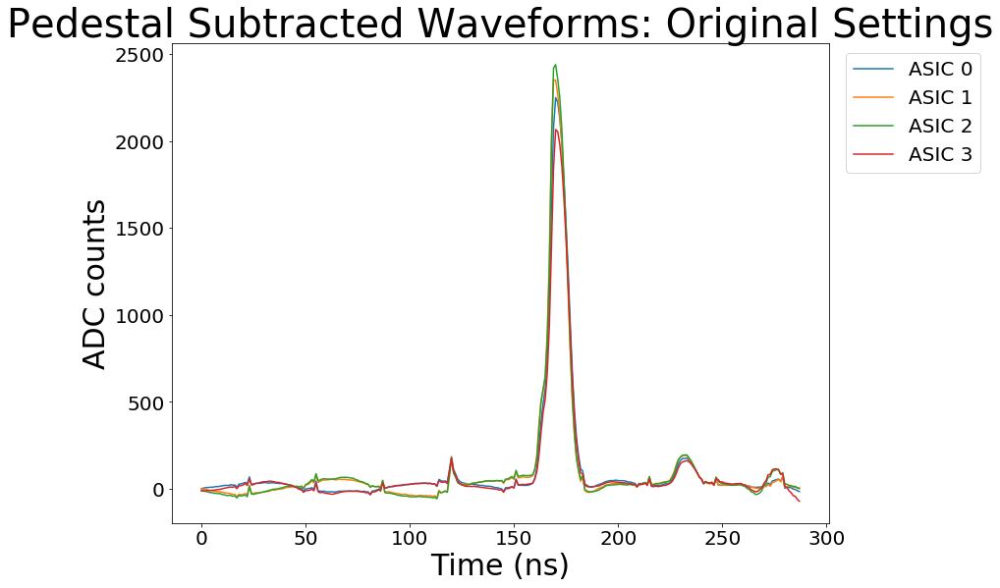

In [41]:
## Original Settings ##

# Find the average original background for each block for each ASIC
# Shape = (ASIC=4, Block=512, Data=288)
original_background_phase = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321506ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            # Get rid of phases>32
            if data['phase'][event]<33:
                current_block = int(data['block'][event])
                if current_block == block:
                    phase = int(data['phase'][event])
                    shift = 31 - phase + 16*(phase>=16) - 16*(phase<16)
                    events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                element.append(events_by_block[event][point])
            average.append(mean(element))
        avg_per_block.append(average)
    original_background_phase.append(avg_per_block)
    
# Find the average pedistal subtracted data for each block for original settings
original_data_phase = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321507ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            # Get rid of phases>32
            if data['phase'][event]<33:
                current_block = int(data['block'][event])
                if current_block == block:
                    phase = int(data['phase'][event])
                    shift = 31 - phase + 16*(phase>=16) - 16*(phase<16)
                    events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                pedistal_subtract = events_by_block[event][point] - original_background_phase[ASIC][block][point]
                element.append(pedistal_subtract)
            average.append(mean(element))
        avg_per_block.append(average)
    original_data_phase.append(avg_per_block)
    
# Combine all blocks for original settings
pedestal_subtracted_original_phase = []
for ASIC in range(4):
    average = []
    for point in range(288):
        by_block = [original_data_phase[ASIC][block][point] for block in range(512)]
        average.append(mean(by_block))
    pedestal_subtracted_original_phase.append(average)
for ASIC in range(4):
    plt.plot(pedestal_subtracted_original_phase[ASIC], label = 'ASIC ' + str(ASIC))
plt.title('Pedestal Subtracted Waveforms: Original Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

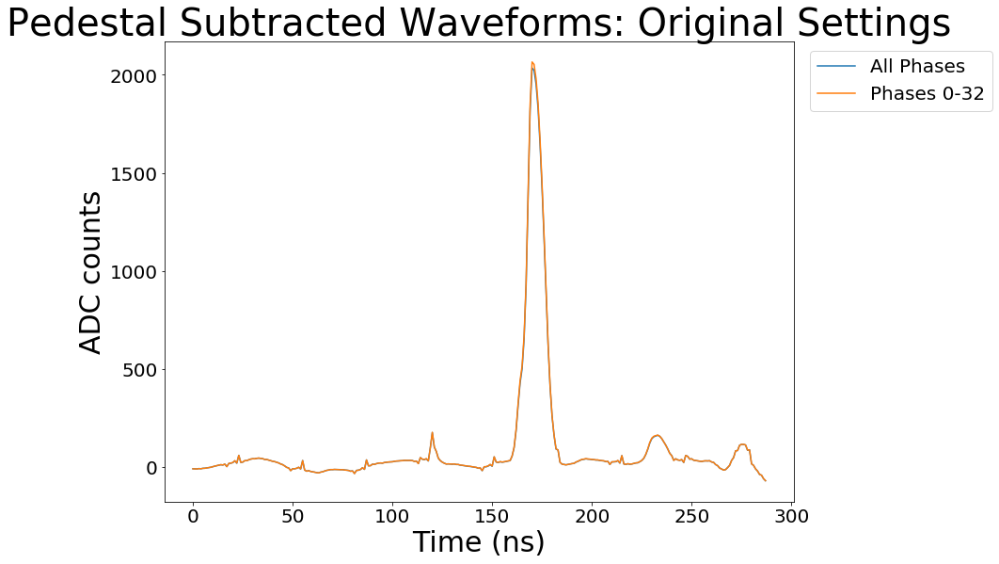

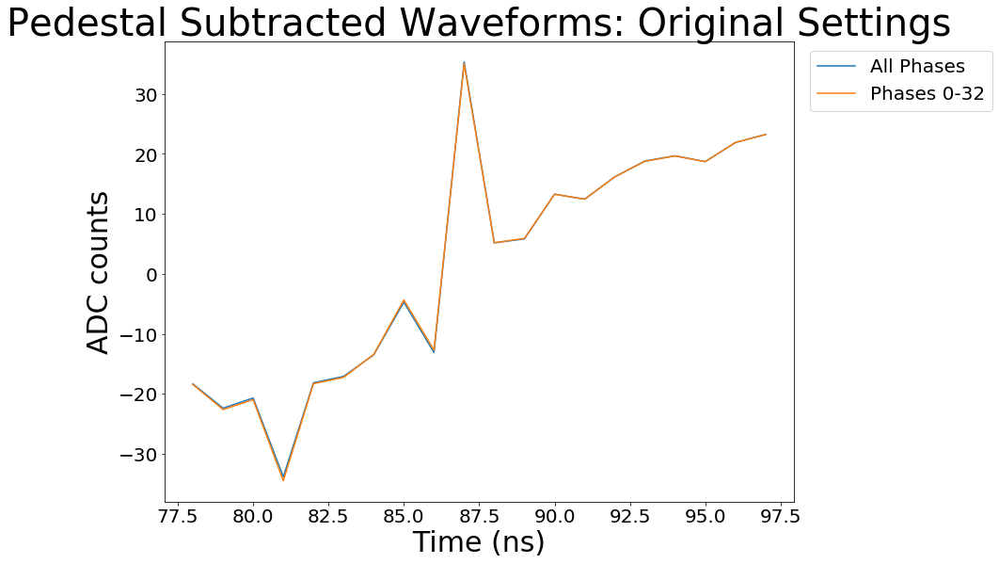

In [44]:
# Plot original settings with and without phase>32

# Full waveform
plt.plot(pedestal_subtracted_original[ASIC], label = 'All Phases')
plt.plot(pedestal_subtracted_original_phase[ASIC], label = 'Phases 0-32')
plt.title('Pedestal Subtracted Waveforms: Original Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

# Zoom in on block boundry
x = [i for i in range(78,98)]
plt.plot(x, pedestal_subtracted_original[ASIC][78:98], label = 'All Phases')
plt.plot(x, pedestal_subtracted_original_phase[ASIC][78:98], label = 'Phases 0-32')
plt.title('Pedestal Subtracted Waveforms: Original Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

In [46]:
# Block boundry issues do not seem to be affected by phases>32

In [47]:
## Change phase 16 treatment ##

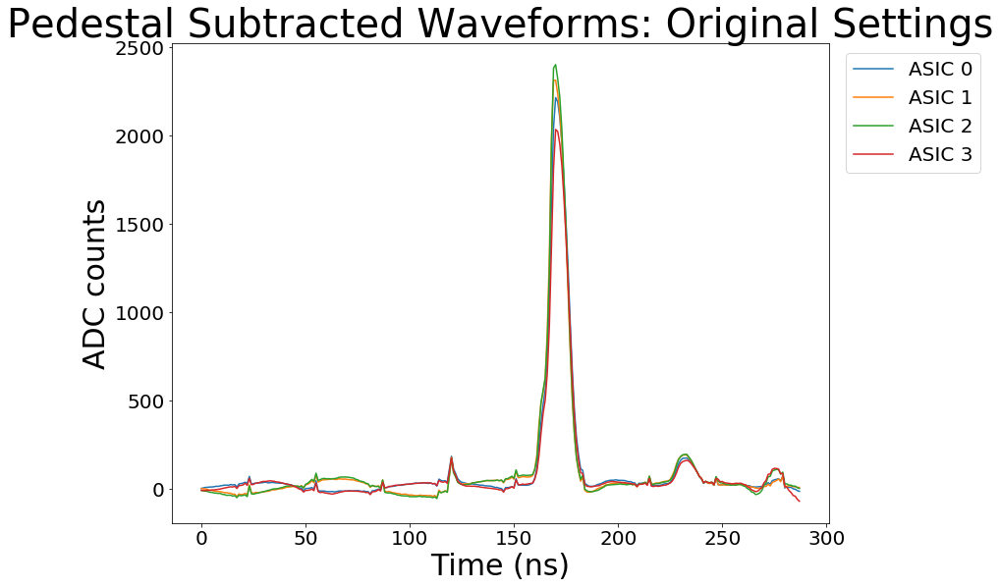

In [48]:
## Original Settings ##

# Find the average original background for each block for each ASIC
# Shape = (ASIC=4, Block=512, Data=288)
original_background_16 = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321506ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            current_block = int(data['block'][event])
            if current_block == block:
                phase = int(data['phase'][event])
                shift = 31 - phase + 16*(phase>16) - 16*(phase<=16)
                events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                element.append(events_by_block[event][point])
            average.append(mean(element))
        avg_per_block.append(average)
    original_background_16.append(avg_per_block)
    
# Find the average pedistal subtracted data for each block for original settings
original_data_16 = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321507ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            current_block = int(data['block'][event])
            if current_block == block:
                phase = int(data['phase'][event])
                shift = 31 - phase + 16*(phase>16) - 16*(phase<=16)
                events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                pedistal_subtract = events_by_block[event][point] - original_background_16[ASIC][block][point]
                element.append(pedistal_subtract)
            average.append(mean(element))
        avg_per_block.append(average)
    original_data_16.append(avg_per_block)
    
# Combine all blocks for original settings
pedestal_subtracted_original_16 = []
for ASIC in range(4):
    average = []
    for point in range(288):
        by_block = [original_data_16[ASIC][block][point] for block in range(512)]
        average.append(mean(by_block))
    pedestal_subtracted_original_16.append(average)
for ASIC in range(4):
    plt.plot(pedestal_subtracted_original_16[ASIC], label = 'ASIC ' + str(ASIC))
plt.title('Pedestal Subtracted Waveforms: Original Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

In [5]:
# Block boundry issues do not seem to be affected by the treatment of phase 16 events

In [6]:
## Investigate if waveforms with the same phase match up ##

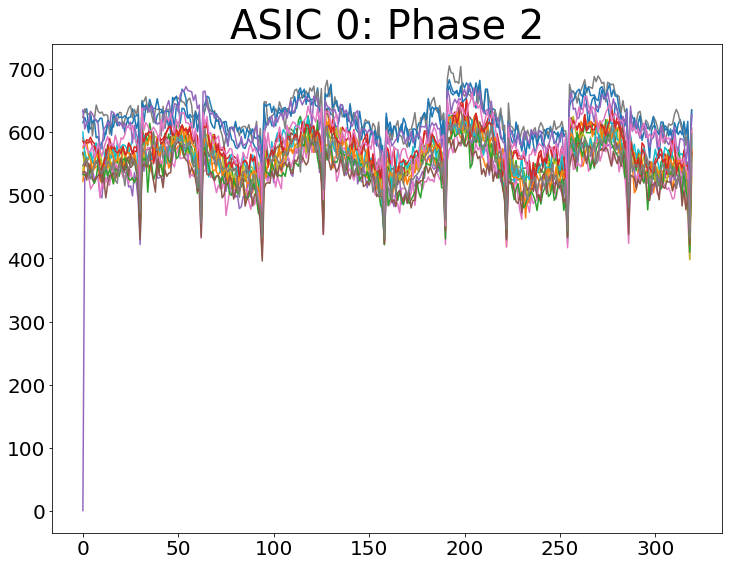

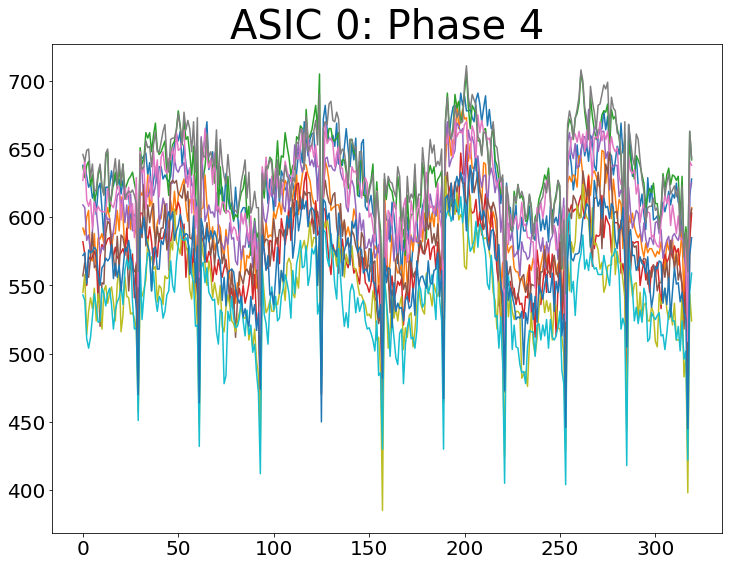

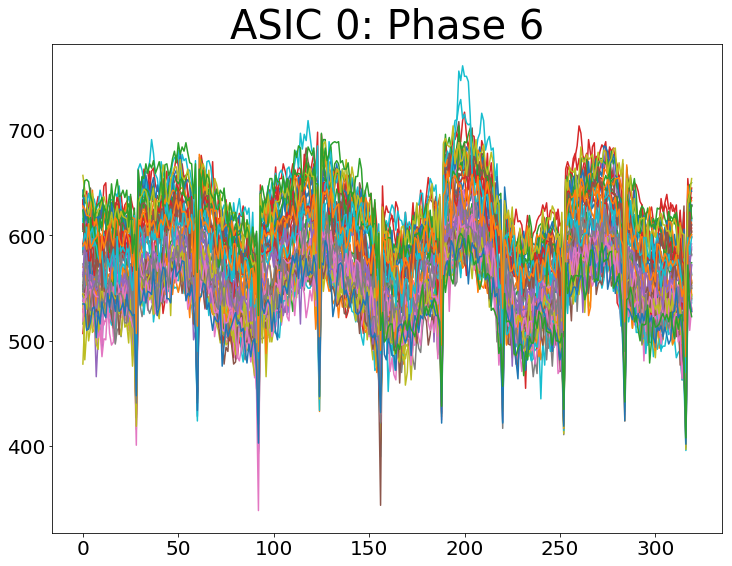

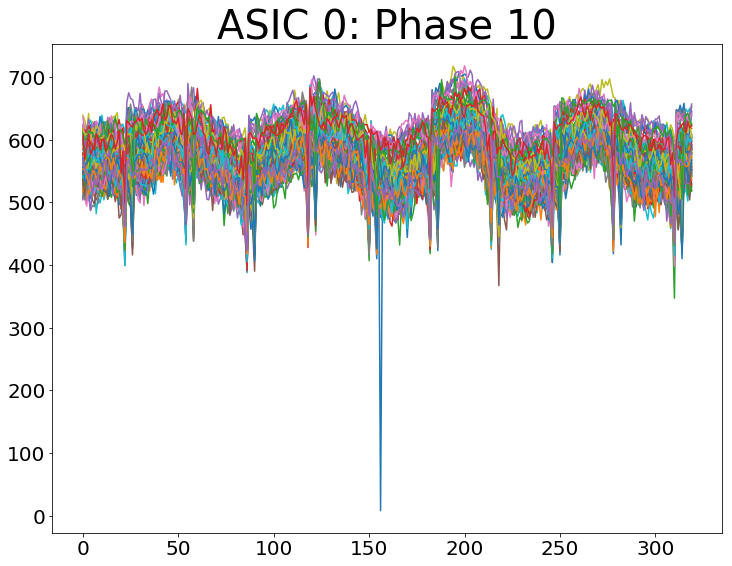

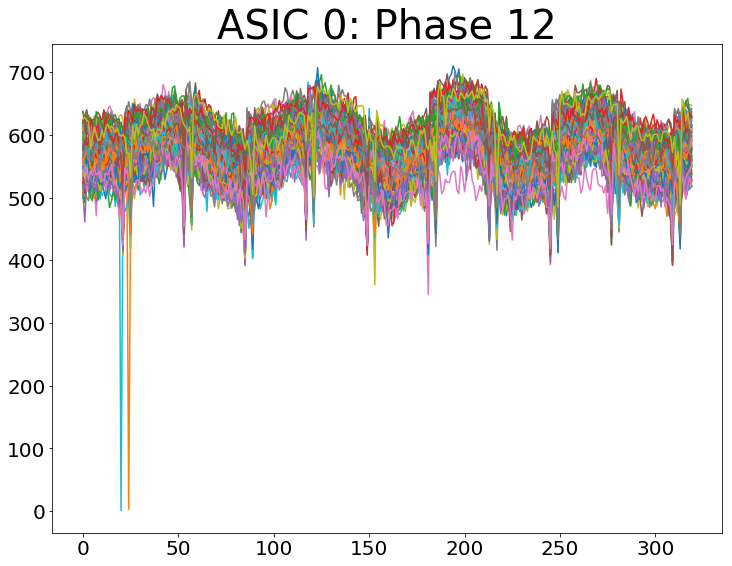

...

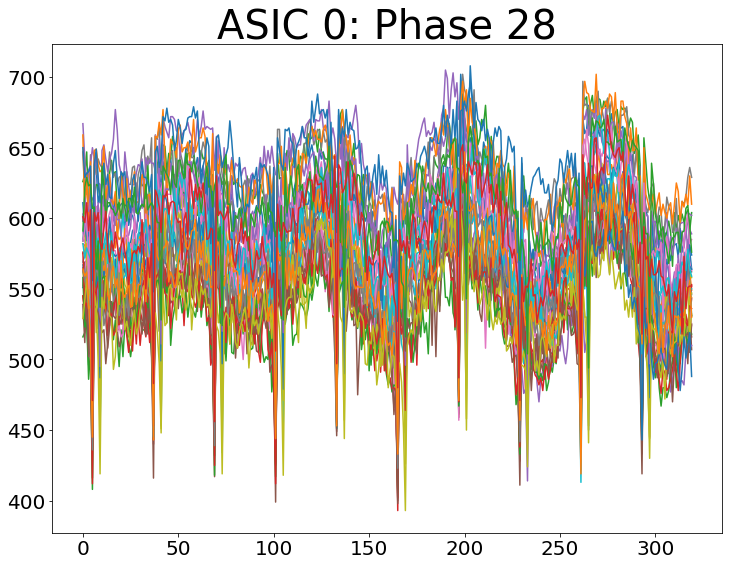

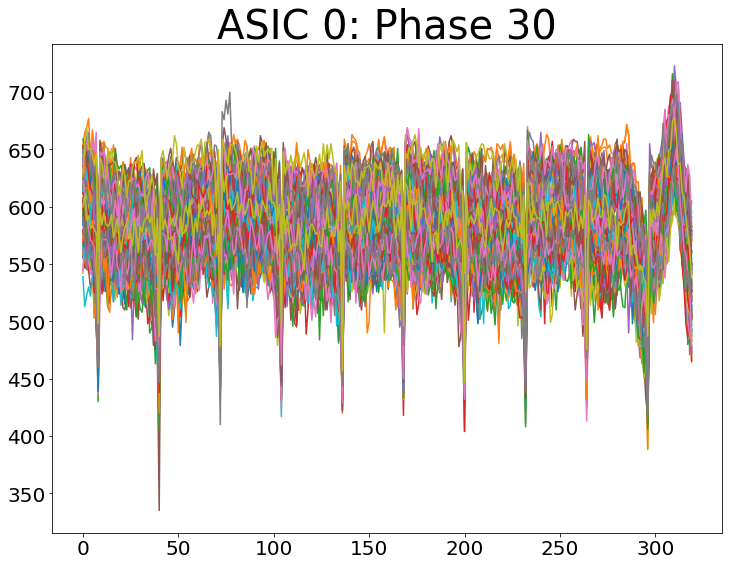

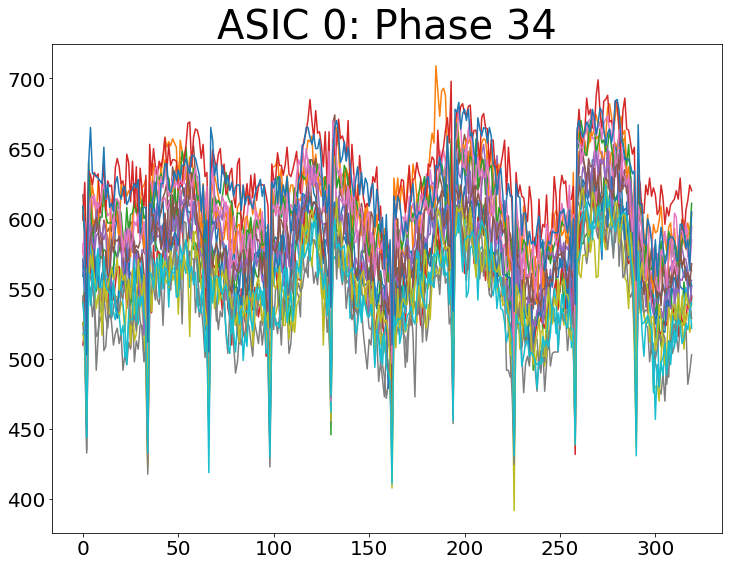

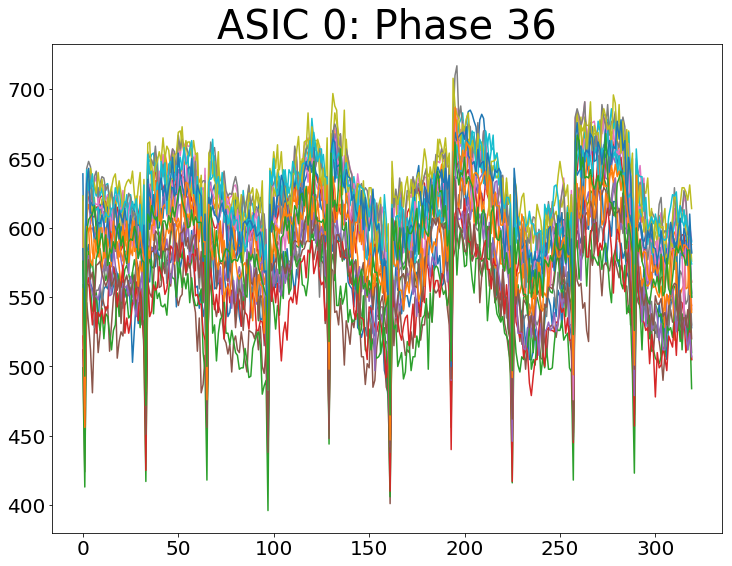

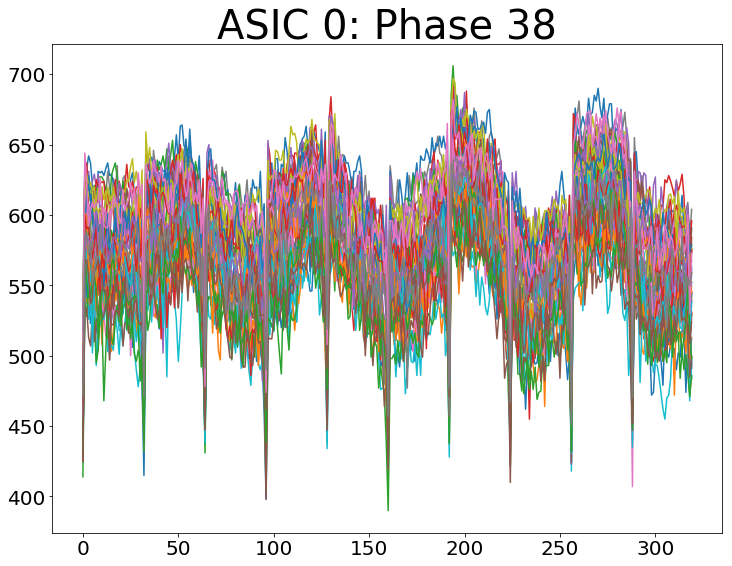

In [5]:
## Plot waveforms for each phase

# Original Background
for ASIC in range(1):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321506ASIC" + str(ASIC) + "CH6.npz", 'r'))
    phase_list = np.unique(data['phase'])
    for phase in phase_list:
        limit=0
        for event in range(len(data['phase'])):
            if data['phase'][event]==phase:
                limit+=1
                if limit<100:
                    plt.plot(data['samples'][event])
        plt.title('ASIC ' + str(ASIC) + ': Phase ' + str(phase))
        plt.show()

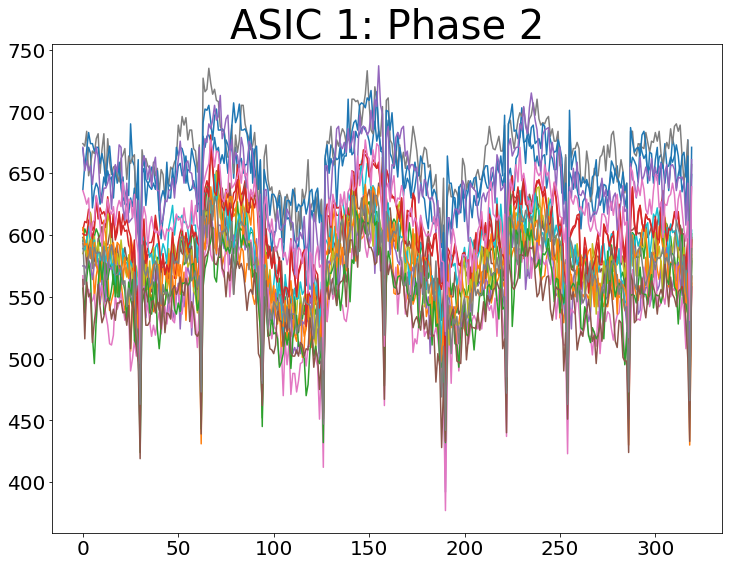

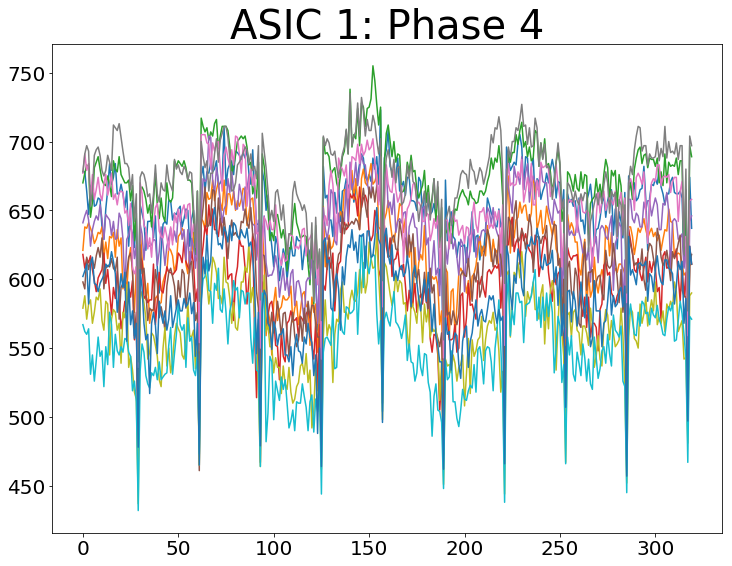

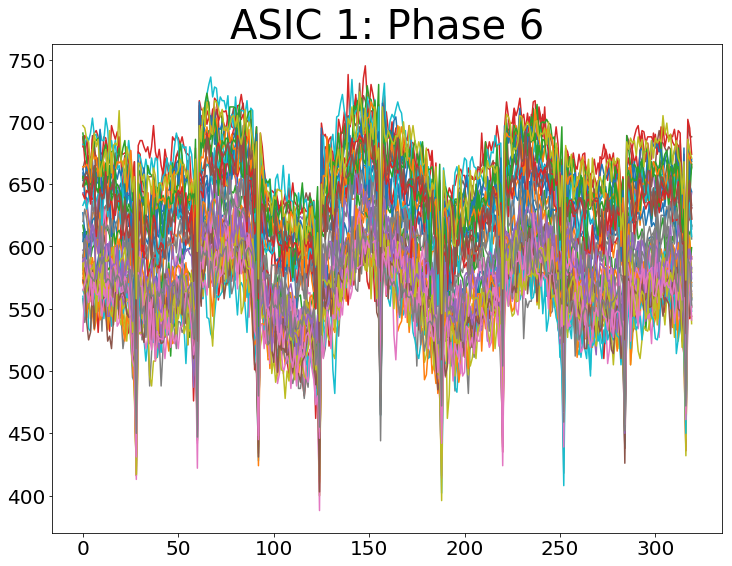

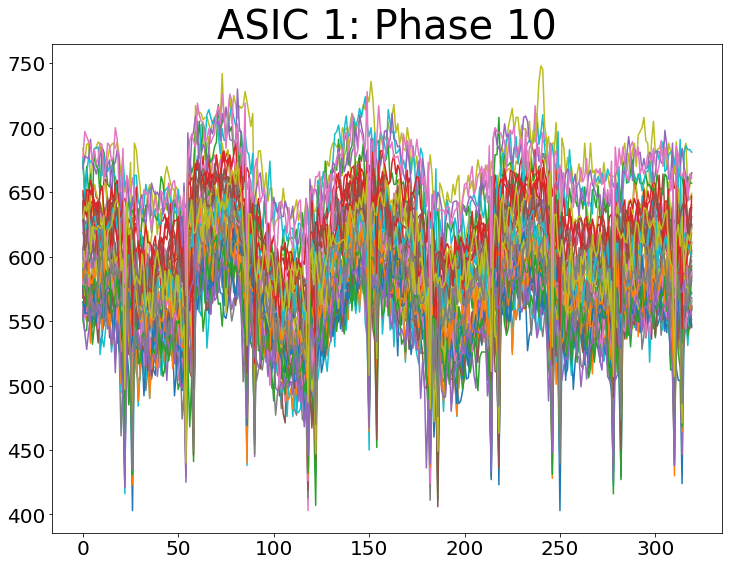

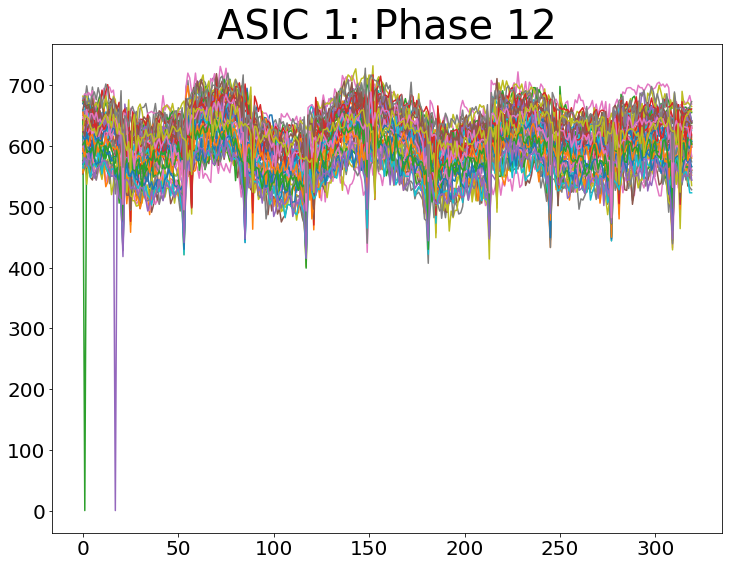

...

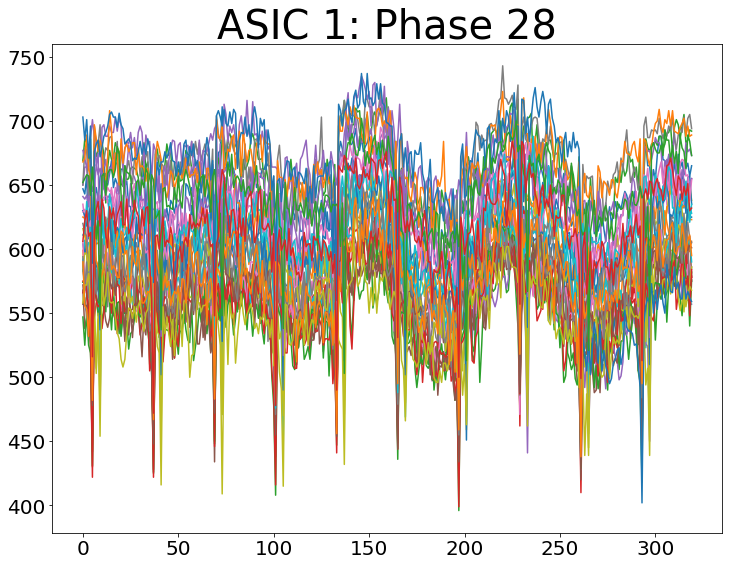

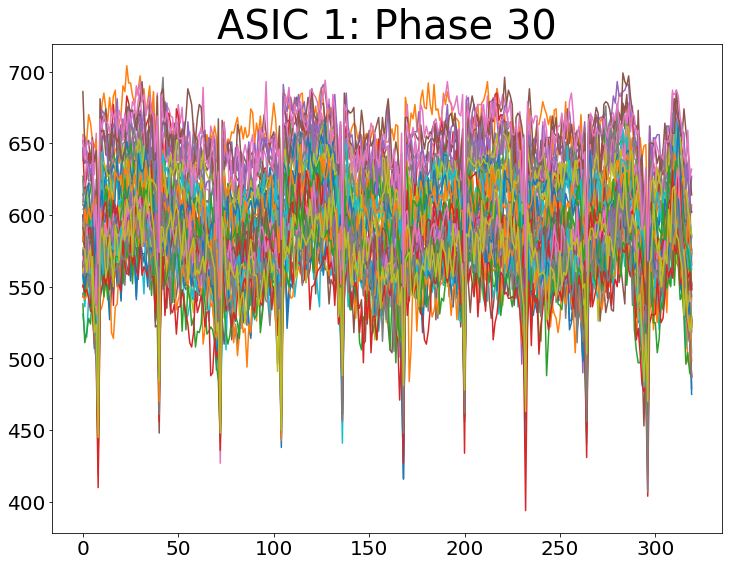

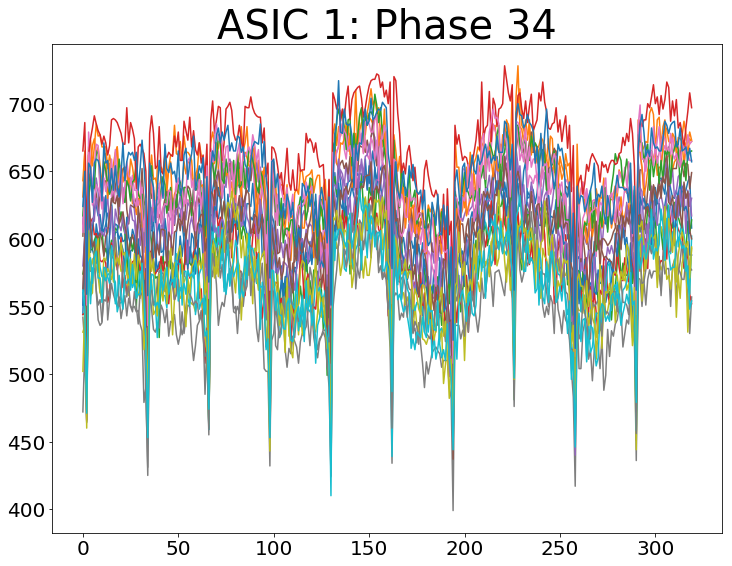

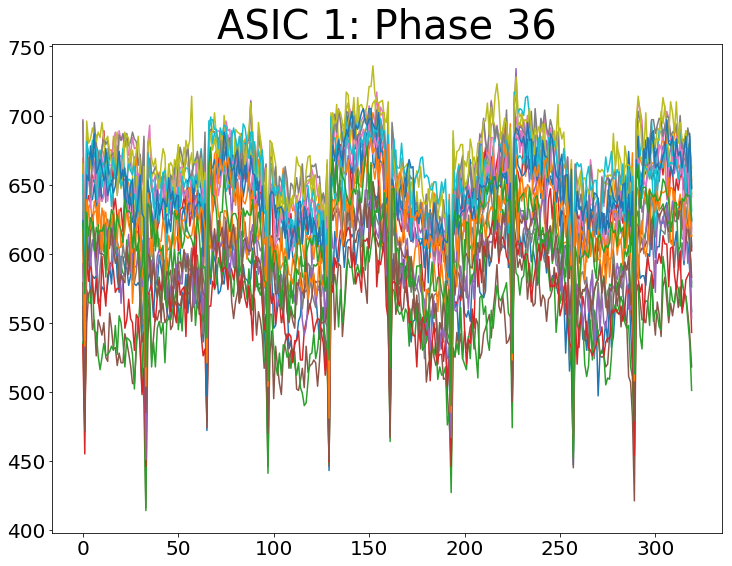

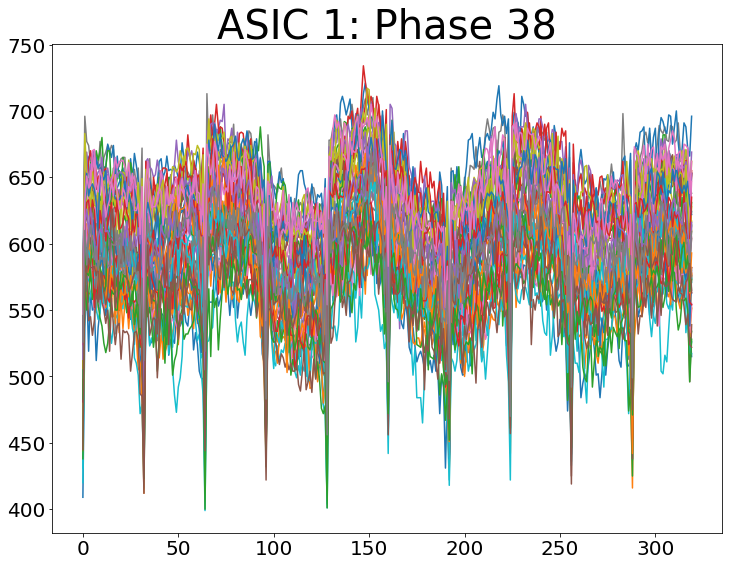

In [4]:
## Plot waveforms for each phase

# Original Background
ASIC=1
data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321506ASIC" + str(ASIC) + "CH6.npz", 'r'))
phase_list = np.unique(data['phase'])
for phase in phase_list:
    limit=0
    for event in range(len(data['phase'])):
        if data['phase'][event]==phase:
            limit+=1
            if limit<50:
                plt.plot(data['samples'][event])
    plt.title('ASIC ' + str(ASIC) + ': Phase ' + str(phase))
    plt.show()

In [7]:
# Unshifted waveforms are not assigned the correct phase - this is what is affecting the pedestal subtraction

In [ ]:
## Check what the splitting amount is for each phase ##

In [41]:
# Find min in the first block for each event for each phase

# Original Background
data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321506ASIC" + str(ASIC) + "CH6.npz", 'r'))
phase_list = np.unique(data['phase'])

min_per_phase = {}
for phase in phase_list:
    limit=0
    mins = []
    for event in range(len(data['phase'])):
        if data['phase'][event]==phase:
            limit+=1
            if limit<100:
                mins.append(np.argmin(data['samples'][event][0:32]))
    min_per_phase[phase] = mins

In [43]:
print(min_per_phase[10]) #22/26
print(min_per_phase[14]) #20/24
print(min_per_phase[18]) #18/14

[12, 10, 10, 1, 22, 26, 22, 22, 22, 22, 2, 22, 26, 22, 22, 22, 26, 22, 6, 4, 22, 4, 22, 22, 26, 22, 26, 22, 22, 26, 22, 26, 26, 22, 22, 26, 22, 22, 26, 22, 22, 22, 22, 26, 22, 22, 22, 26, 22, 22, 26, 26, 22, 22, 22, 22, 22, 26, 26, 22, 22, 22, 26, 22, 26, 22, 22, 22, 26, 22, 22, 22, 22, 26, 22, 22, 22, 22, 26, 22, 26, 22, 26, 22, 22]
[20, 20, 20, 16, 20, 24, 24, 24, 2, 20, 24, 24, 20, 24, 24, 24, 20, 24, 20, 24, 20, 20, 24, 20, 20, 20, 20, 24, 20, 24, 20, 20, 20, 20, 20, 24, 24, 20, 24, 24, 20, 20, 20, 20, 24, 20, 20, 20, 24, 24, 24, 24, 2, 24, 24, 24, 24, 20, 24, 24, 24, 20, 20, 20, 20, 20, 20, 24, 24, 20, 20, 20, 24, 24, 20, 24, 24, 20, 20, 20, 20, 24, 24, 24, 20, 20, 20, 20, 24, 24, 20, 24, 24, 20, 20, 24, 24, 24, 24]
[18, 3, 7, 18, 14, 18, 18, 18, 18, 18, 18, 18, 18, 14, 18, 18, 18, 18, 18, 1, 18, 14]


In [44]:
print(mode(min_per_phase[10]))

NameError: name 'mode' is not defined

In [8]:
## Use lowest point as reference instead of phase ##

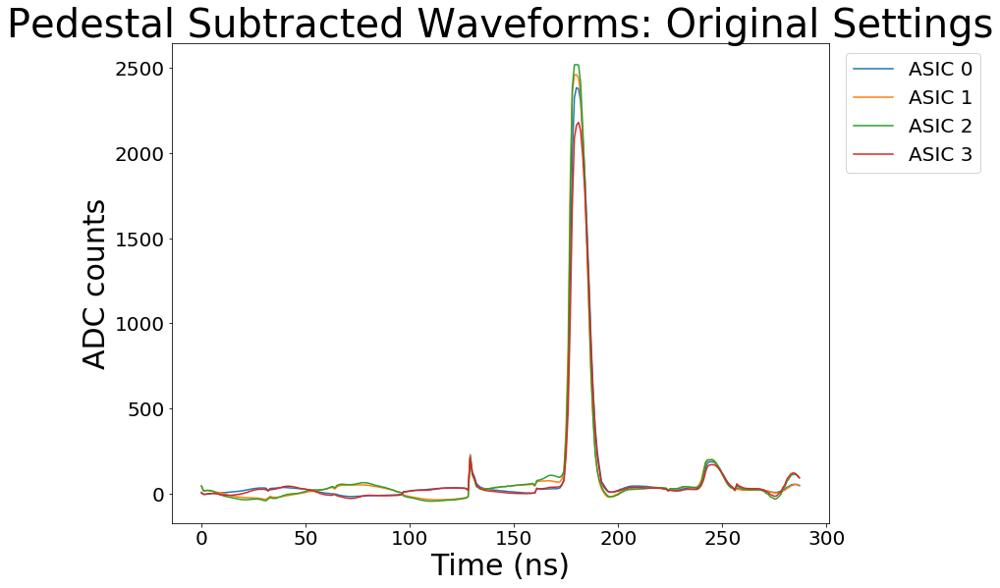

In [30]:
## Original Settings - Using lowest point ##

# Find the average original background for each block for each ASIC
# Shape = (ASIC=4, Block=512, Data=288)

o_back = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321506ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            samples = np.ndarray.tolist(data['samples'][event])
            if samples.count(0)==0:
                current_block = int(data['block'][event])
                if current_block == block:
                    first_block = np.ndarray.tolist(data['samples'][event][0:32])
                    min_val = min(first_block)
                    shift = np.ndarray.tolist(data['samples'][event]).index(min_val)
                    events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                element.append(events_by_block[event][point])
            average.append(mean(element))
        avg_per_block.append(average)
    o_back.append(avg_per_block)
    
# Find the average pedistal subtracted data for each block for original settings
o_data = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321507ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            samples = np.ndarray.tolist(data['samples'][event])
            if samples.count(0)==0:
                current_block = int(data['block'][event])
                if current_block == block:
                    sample_list = np.ndarray.tolist(data['samples'][event][0:32])
                    min_val = min(sample_list)
                    shift = np.ndarray.tolist(data['samples'][event]).index(min_val)
                    events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                pedistal_subtract = events_by_block[event][point] - o_back[ASIC][block][point]
                element.append(pedistal_subtract)
            average.append(mean(element))
        avg_per_block.append(average)
    o_data.append(avg_per_block)
    
# Average all blocks for original settings
o_pedsub = []
for ASIC in range(4):
    average = []
    for point in range(288):
        by_block = [o_data[ASIC][block][point] for block in range(512)]
        average.append(mean(by_block))
    o_pedsub.append(average)

# Plot
for ASIC in range(4):
    plt.plot(o_pedsub[ASIC], label = 'ASIC ' + str(ASIC))
plt.title('Pedestal Subtracted Waveforms: Original Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

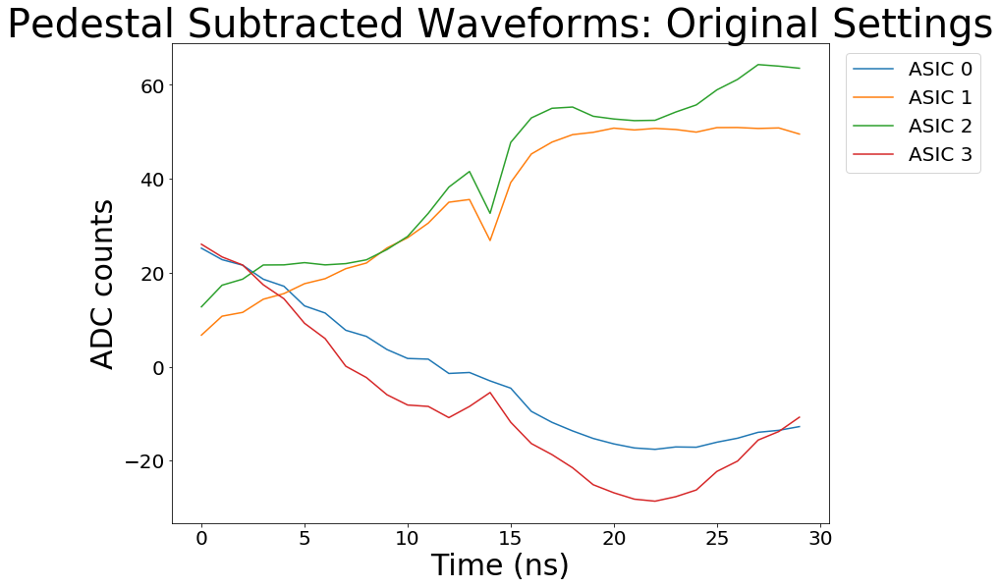

In [31]:
# Zoom in on Plot
for ASIC in range(4):
    plt.plot(o_pedsub[ASIC][50:80], label = 'ASIC ' + str(ASIC))
plt.title('Pedestal Subtracted Waveforms: Original Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

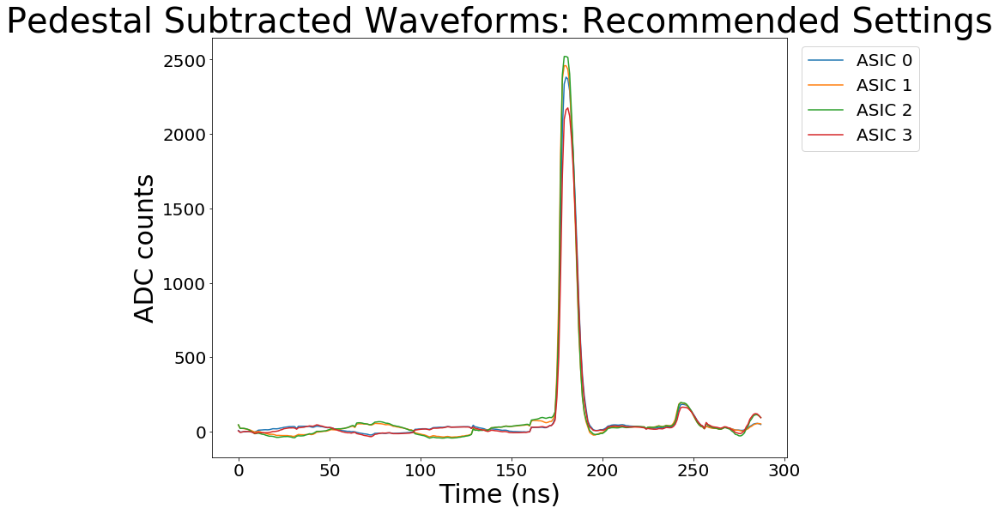

In [32]:
## New Settings - Using lowest point ##

# Find the average new background for each block for each ASIC
# Shape = (ASIC=4, Block=512, Data=288)

n_back = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321508ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            samples = np.ndarray.tolist(data['samples'][event])
            if samples.count(0)==0:
                current_block = int(data['block'][event])
                if current_block == block:
                    first_block = np.ndarray.tolist(data['samples'][event][0:32])
                    min_val = min(first_block)
                    shift = np.ndarray.tolist(data['samples'][event]).index(min_val)
                    events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                element.append(events_by_block[event][point])
            average.append(mean(element))
        avg_per_block.append(average)
    n_back.append(avg_per_block)

# Find the average pedistal subtracted data for each block for New settings
n_data = []
for ASIC in range(4):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/New Parameter Set/sampleFileAllBlocks_run321509ASIC" + str(ASIC) + "CH6.npz", 'r'))
    avg_per_block = []
    for block in range(512):
        events_by_block = []
        for event in range(len(data['event'])):
            samples = np.ndarray.tolist(data['samples'][event])
            if samples.count(0)==0:
                current_block = int(data['block'][event])
                if current_block == block:
                    sample_list = np.ndarray.tolist(data['samples'][event][0:32])
                    min_val = min(sample_list)
                    shift = np.ndarray.tolist(data['samples'][event]).index(min_val)
                    events_by_block.append(data['samples'][event][shift:shift+288])
        average = []
        for point in range(len(events_by_block[0])):
            element = []
            for event in range(len(events_by_block)):
                pedistal_subtract = events_by_block[event][point] - o_back[ASIC][block][point]
                element.append(pedistal_subtract)
            average.append(mean(element))
        avg_per_block.append(average)
    n_data.append(avg_per_block)

# Average all blocks for new settings
n_pedsub = []
for ASIC in range(4):
    average = []
    for point in range(288):
        by_block = [n_data[ASIC][block][point] for block in range(512)]
        average.append(mean(by_block))
    n_pedsub.append(average)

# Plot
for ASIC in range(4):
    plt.plot(n_pedsub[ASIC], label = 'ASIC ' + str(ASIC))
plt.title('Pedestal Subtracted Waveforms: Recommended Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

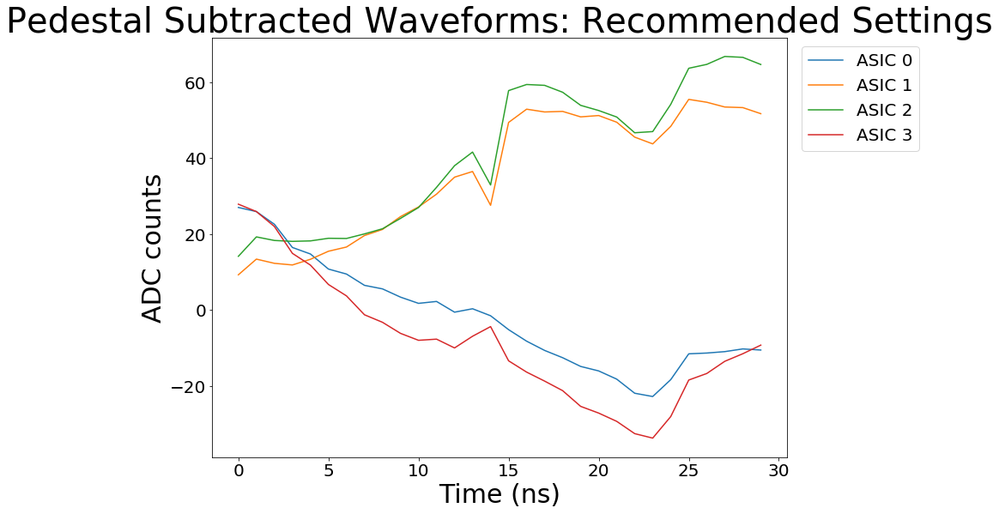

In [34]:
# Zoom in on Plot
for ASIC in range(4):
    plt.plot(n_pedsub[ASIC][50:80], label = 'ASIC ' + str(ASIC))
plt.title('Pedestal Subtracted Waveforms: Recommended Settings')
plt.ylabel('ADC counts')
plt.xlabel('Time (ns)')
plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
plt.show()

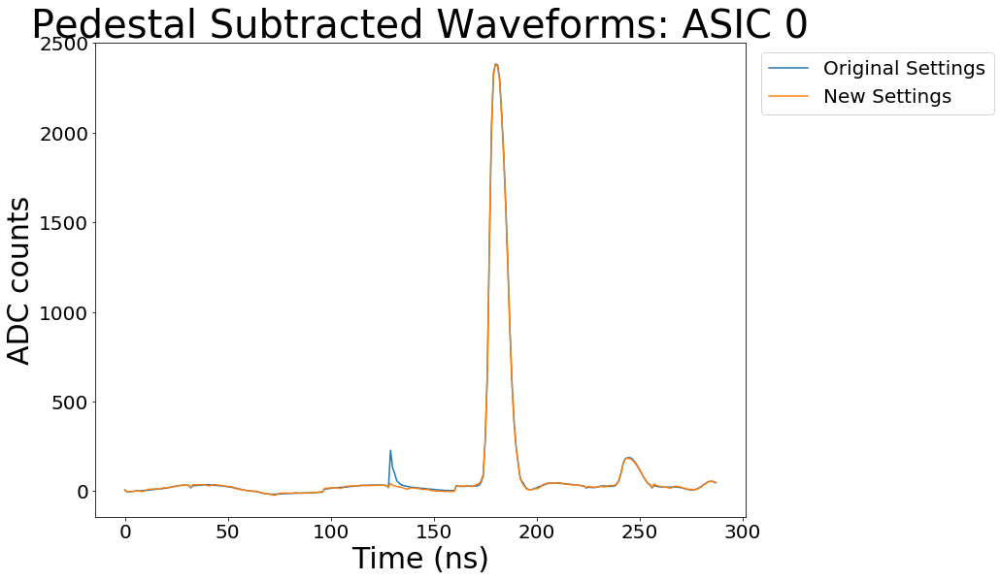

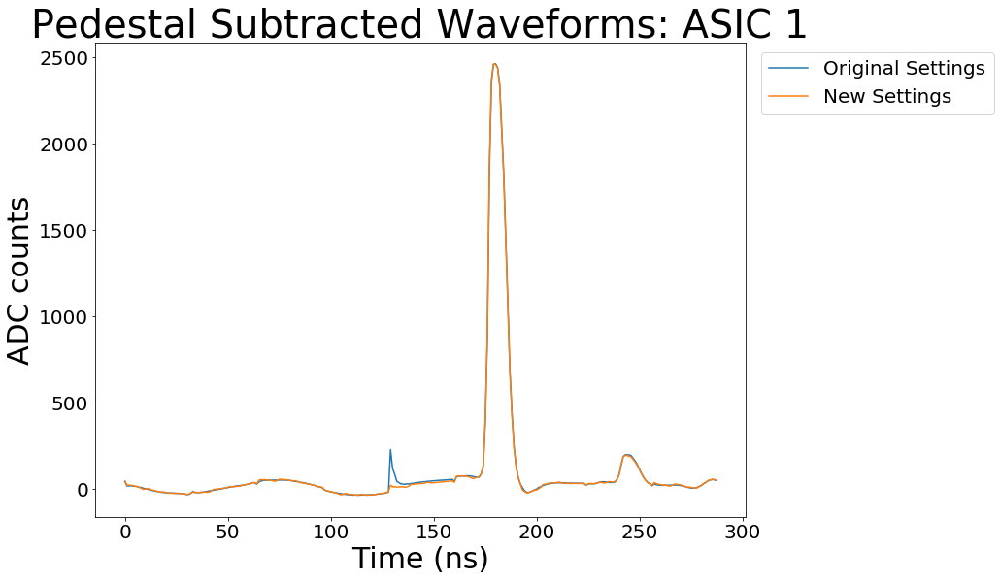

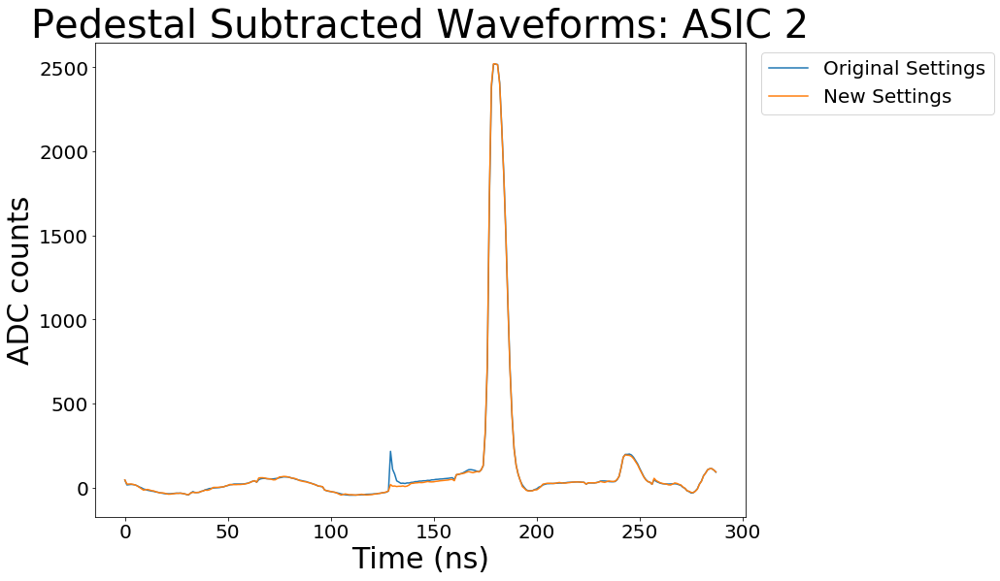

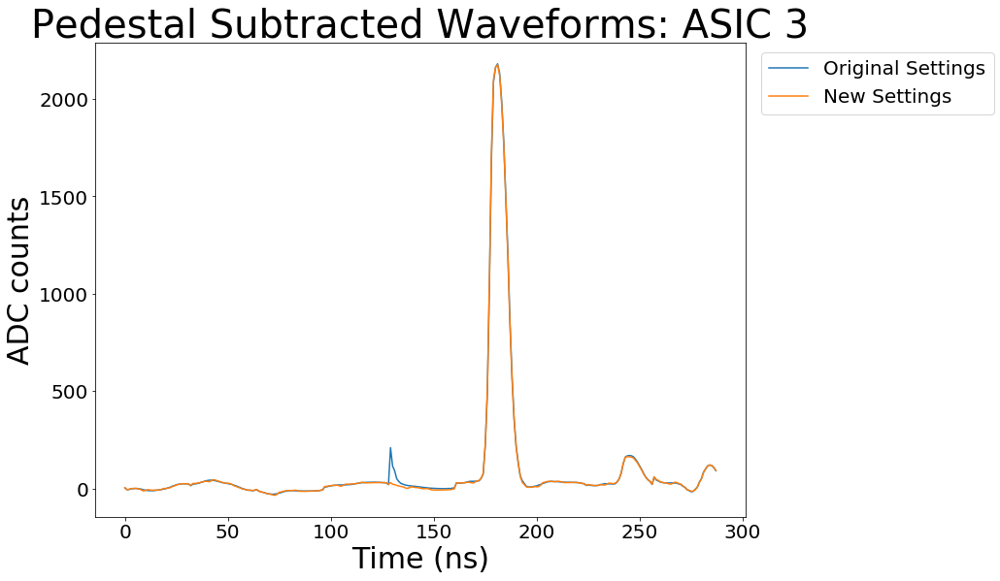

In [37]:
# Plot by ASIC for both settings

for ASIC in range(4):
    plt.plot(o_pedsub[ASIC], label = 'Original Settings')
    plt.plot(n_pedsub[ASIC], label = 'New Settings')
    plt.title('Pedestal Subtracted Waveforms: ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()

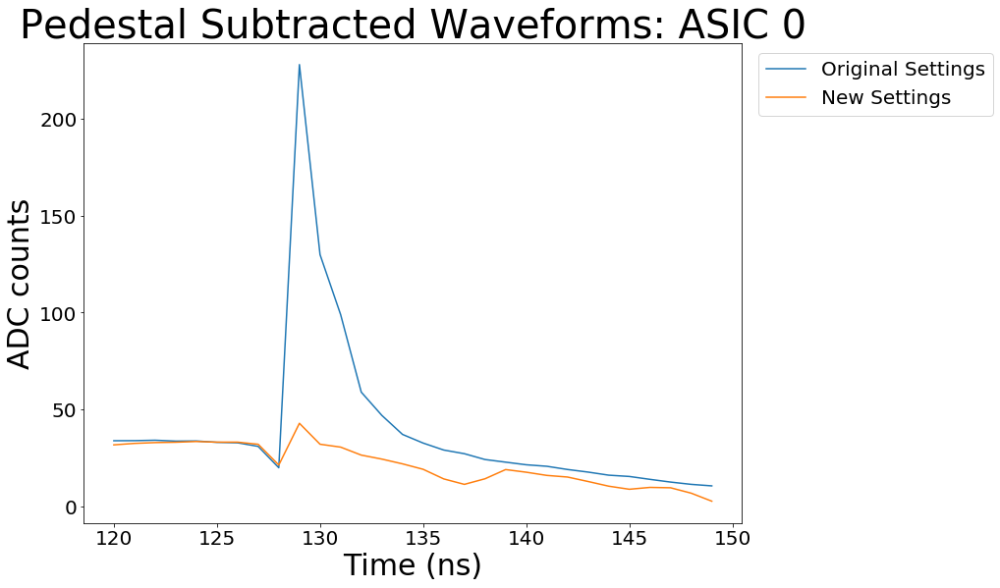

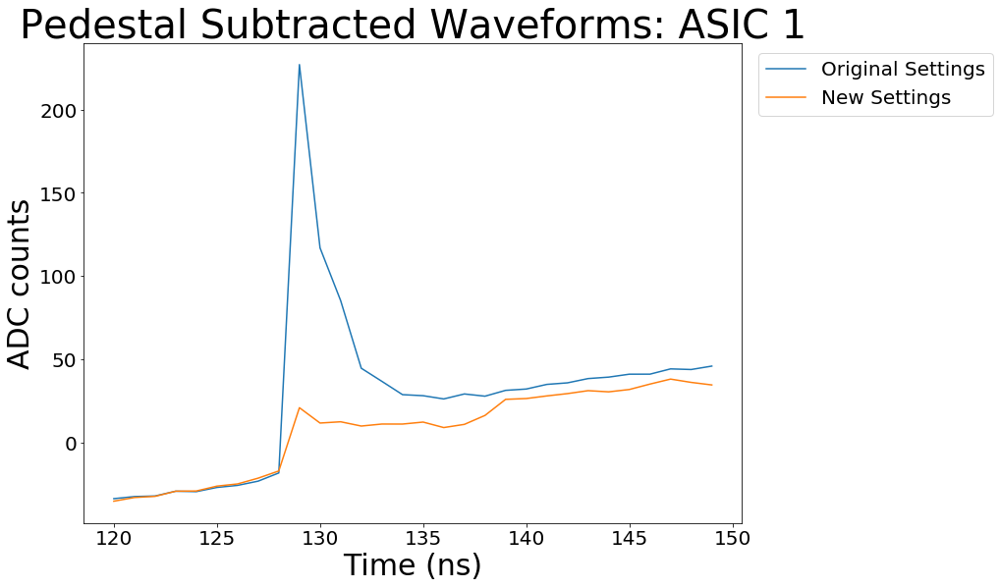

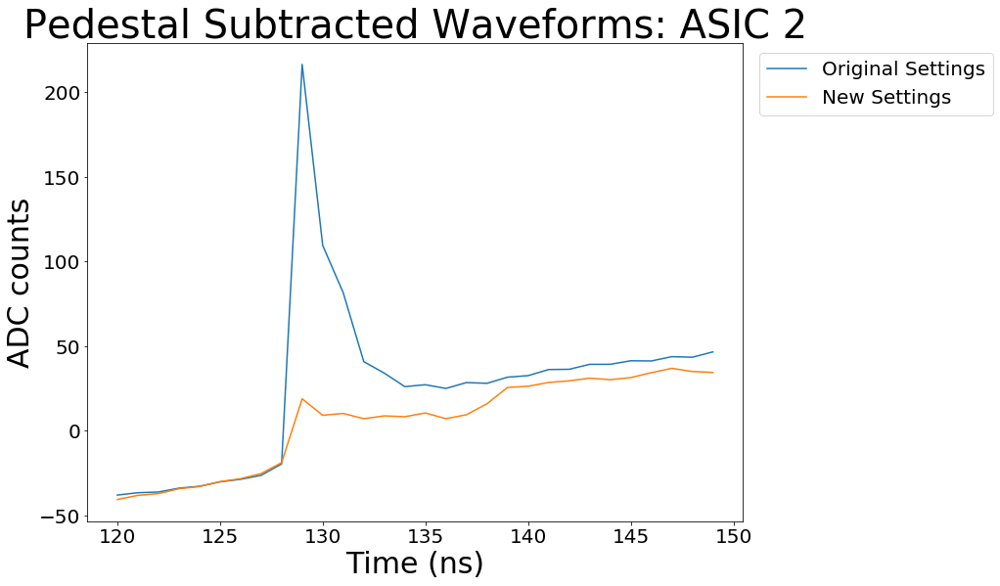

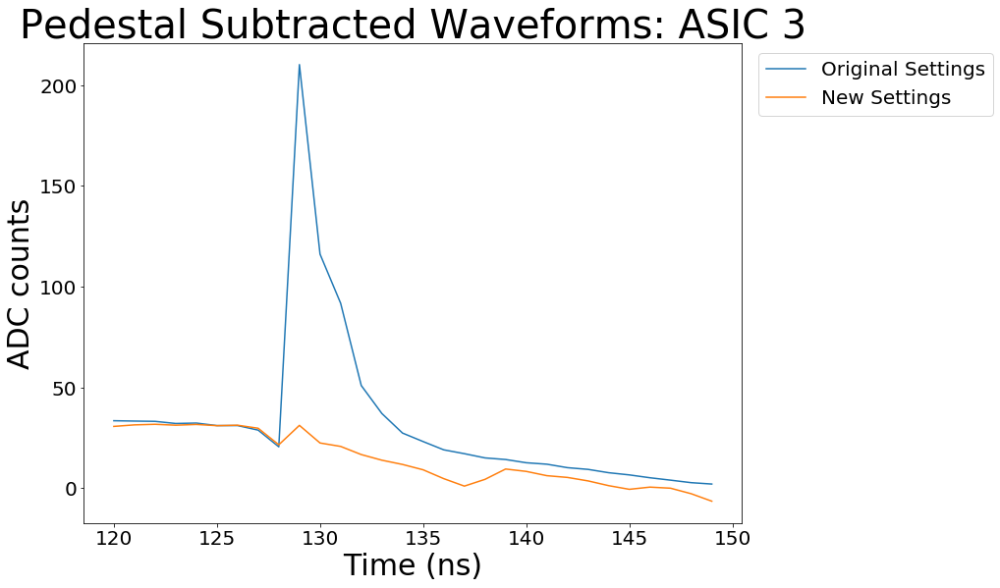

In [36]:
# Zoom in on Glitch for both settings

x = [i for i in range(120,150)]
for ASIC in range(4):
    plt.plot(x, o_pedsub[ASIC][120:150], label = 'Original Settings')
    plt.plot(x, n_pedsub[ASIC][120:150], label = 'New Settings')
    plt.title('Pedestal Subtracted Waveforms: ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()